In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

In [3]:
image_path = os.path.join("lena_std.tif")
image = cv2.imread(image_path)
# print the shape of the image
print(image.shape)
# print the size of the image   
print(image.size)
# print the data type of the image
print(image.dtype)
# print the dimension of the image
print(image.ndim)

(512, 512, 3)
786432
uint8
3


In [4]:
# print the image in the numpy array format
print(image)

[[[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 [[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 [[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 ...

 [[ 60  18  84]
  [ 60  18  84]
  [ 58  27  92]
  ...
  [ 84  73 173]
  [ 76  68 172]
  [ 79  62 177]]

 [[ 57  22  82]
  [ 57  22  82]
  [ 62  32  96]
  ...
  [ 79  70 179]
  [ 81  71 181]
  [ 81  74 185]]

 [[ 57  22  82]
  [ 57  22  82]
  [ 62  32  96]
  ...
  [ 79  70 179]
  [ 81  71 181]
  [ 81  74 185]]]


In [5]:
# Get the basic information
file_name = os.path.basename(image_path)  # Extract file name
file_size = os.path.getsize(image_path)   # Get file size in bytes
file_format = image_path.split('.')[-1]  # Get file format (e.g., jpg, png)
height, width, channels = image.shape    # Get image dimensions (height, width, channels)

# For color space, OpenCV loads images in BGR by default
color_space = "BGR"  # You can check if it is RGB or another format, but OpenCV uses BGR by default

# Print the extracted information
print(f"File Name: {file_name}")
print(f"File Size: {file_size / 1024:.2f} KB")  # Size in KB
print(f"File Format: {file_format}")
print(f"Image Dimensions: {width}x{height}")
print(f"Color Space: {color_space}")

# For resolution (DPI/PPI), OpenCV doesn't directly provide DPI info, but you can check the image properties if available
print("Resolution (DPI/PPI): Not available through OpenCV")

File Name: lena_std.tif
File Size: 768.14 KB
File Format: tif
Image Dimensions: 512x512
Color Space: BGR
Resolution (DPI/PPI): Not available through OpenCV


In [6]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [7]:
from PIL import Image
import matplotlib.pyplot as plt

In [8]:
img = Image.open("lena_std.tif")

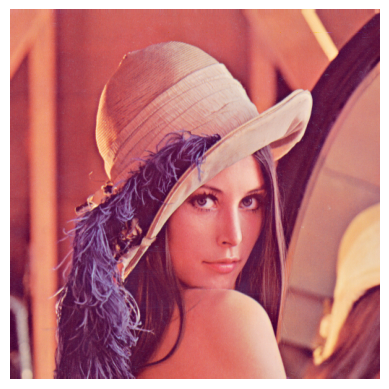

In [9]:
# Display the image inline
plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.show()

In [11]:
ret, im_bw = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

In [12]:
ret, thresh1 = cv2.threshold(gray_image, 120, 255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(gray_image, 120, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(gray_image, 120, 255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(gray_image, 120, 255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(gray_image, 120, 255, cv2.THRESH_TOZERO_INV)

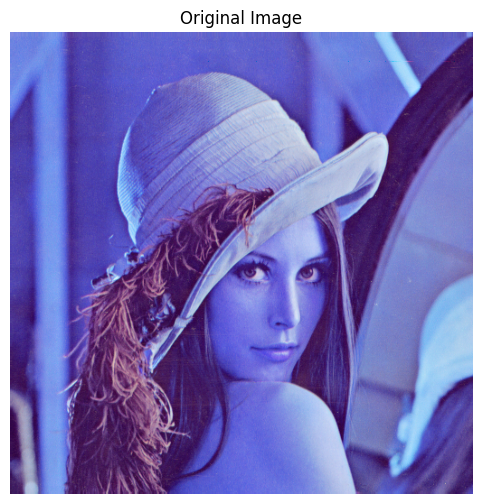

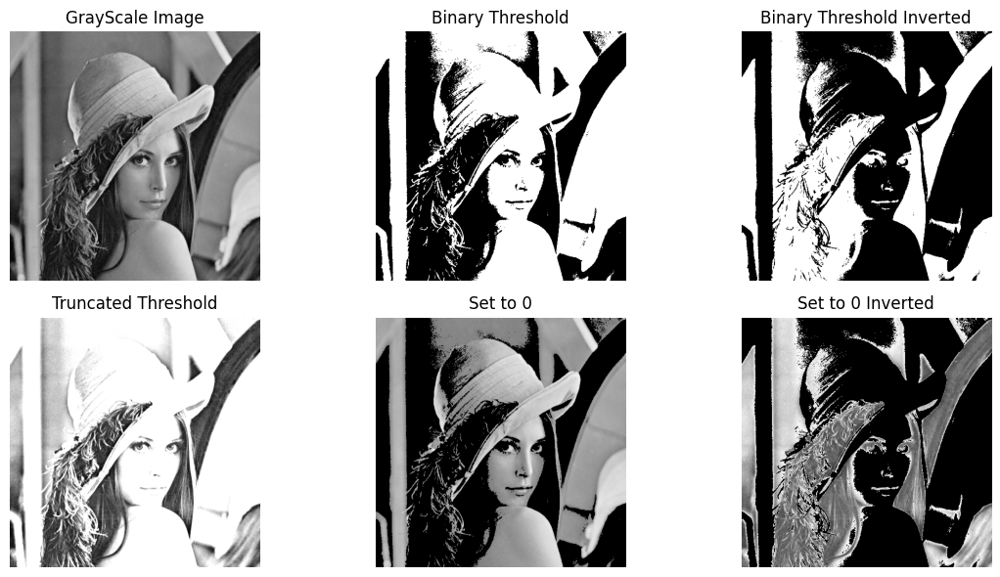

In [16]:
import matplotlib.pyplot as plt

# Display the images

plt.figure(figsize=(12, 6))
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Original Image')

plt.figure(figsize=(12, 6))
plt.subplot(231)
plt.imshow(gray_image, cmap='gray')
plt.axis('off')
plt.title('GrayScale Image')

plt.subplot(232)
plt.imshow(thresh1, cmap='gray')
plt.axis('off')
plt.title('Binary Threshold')

plt.subplot(233)
plt.imshow(thresh2, cmap='gray')
plt.axis('off')
plt.title('Binary Threshold Inverted')


plt.subplot(234)
plt.imshow(thresh3, cmap='gray')
plt.axis('off')
plt.title('Truncated Threshold')

plt.subplot(235)
plt.imshow(thresh4, cmap='gray')
plt.axis('off')
plt.title('Set to 0')

plt.subplot(236)
plt.imshow(thresh5, cmap='gray')
plt.axis('off')
plt.title('Set to 0 Inverted')

plt.tight_layout()
plt.show()

BINARY

What it does: Converts all pixels above a given threshold to the maximum value (255, typically white) and those below the threshold to 0 (black).

General Use Case: When you want to highlight or segment out certain features that are significantly different from the background, typically for object detection or segmentation tasks.

Application Examples:

Document Scanning

Object Detection: white balls on a green field, bright objects on a dark surface

Medical Imaging: tumors or abnormalities X-rays, MRIs, or CT scans.

OCR (Optical Character Recognition)

BINARY_INV

What it does: Inverts THRESH_BINARY. Pixels below the threshold are set to white (255), and those above are set to black (0).

General Use Case: When you want to highlight dark features on a lighter background or need to isolate dark objects.

Application Examples: 

Background Removal: defects in materials or dark objects on a lighter surface

Defect Detection

Image Segmentation: dark features in images such as shadows or specific object shapes on lighter backgrounds

TRUNC

What it does: Keeps pixels below the threshold as they are, while pixels above the threshold are set to the threshold value.

General Use Case: When you want to limit the intensity of pixels to a specific range, typically to suppress overly bright areas while preserving other image details.

Application Examples: 

Contrast Enhancement:

Text(0.5, 1.0, 'Adaptive Thresholding Gaussian')

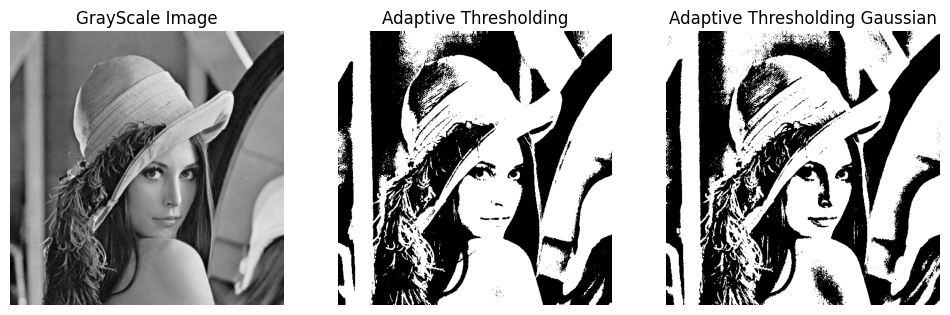

In [21]:
# adaptive thresholding
# Applying adaptive thresholding
adaptive_thresh = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 199, 5)


# Applying adaptive thresholding gaussian
adaptive_thresh_gaussian = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 199,5)


# Display the images
plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(gray_image, cmap='gray')
plt.axis('off')
plt.title('GrayScale Image')

plt.subplot(132)
plt.imshow(adaptive_thresh, cmap='gray')
plt.axis('off')
plt.title('Adaptive Thresholding')

plt.subplot(133)
plt.imshow(adaptive_thresh_gaussian, cmap='gray')
plt.axis('off')
plt.title('Adaptive Thresholding Gaussian')

Text(0.5, 1.0, 'OTSU Thresholding')

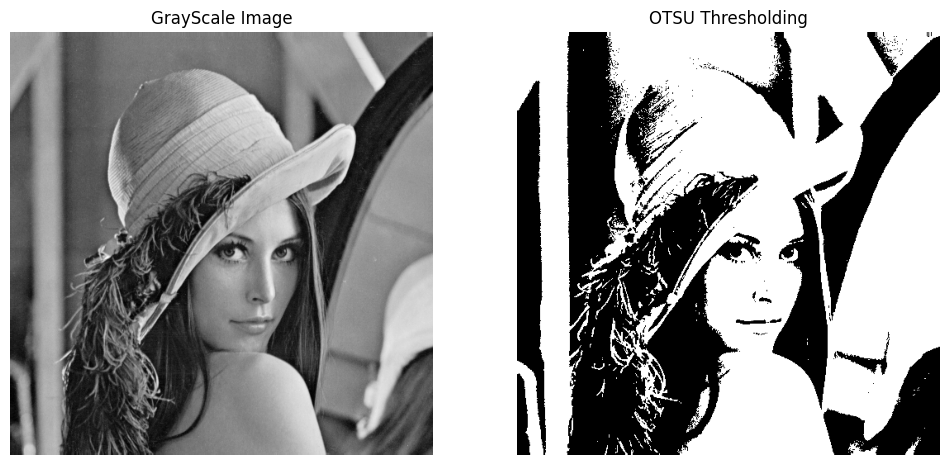

In [22]:
# OTSU thresholding
# Applying OTSU thresholding
ret, otsu_thresh = cv2.threshold(gray_image, 120, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display the images
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(gray_image, cmap='gray')
plt.axis('off')
plt.title('GrayScale Image')

plt.subplot(122)
plt.imshow(otsu_thresh, cmap='gray')
plt.axis('off')
plt.title('OTSU Thresholding')

Text(0.5, 1.0, 'Original Image')

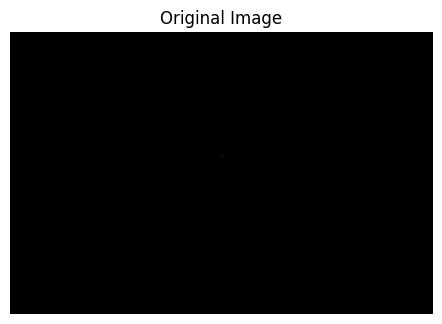

In [7]:
# Convert the image to HSV color space
pepsi = cv2.imread("Pepsi.webp")
mahe = cv2.imread("Manipal_University_logo.webp")
msis = cv2.imread("MAHE.jpg")
hsv_image1 = cv2.cvtColor(msis, cv2.COLOR_BGR2HSV)
hsv_image2 = cv2.cvtColor(pepsi, cv2.COLOR_BGR2HSV)
hsv_image3 = cv2.cvtColor(mahe, cv2.COLOR_BGR2HSV)

# apply the thresholding mask
lower_red = np.array([0, 120, 70])
upper_red = np.array([10, 255, 255])
mask = cv2.inRange(hsv_image2, lower_red, upper_red)
result = cv2.bitwise_and(pepsi, pepsi, mask=mask)
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Original Image')

In [10]:
import cv2
import numpy as np

# Read the image
image = cv2.imread('Pepsi.webp')

# Convert the image from BGR to HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the range for the red color in HSV
# These values can be adjusted based on the specific shade of red you want to extract
lower_red_1 = np.array([0, 120, 70])
upper_red_1 = np.array([10, 255, 255])

lower_red_2 = np.array([170, 120, 70])
upper_red_2 = np.array([180, 255, 255])

# Threshold the image to get only the red parts
mask1 = cv2.inRange(hsv_image, lower_red_1, upper_red_1)
mask2 = cv2.inRange(hsv_image, lower_red_2, upper_red_2)

# Combine the two masks to get the full red range
red_mask = cv2.bitwise_or(mask1, mask2)

# Extract the red regions from the original image
red_only = cv2.bitwise_and(image, image, mask=red_mask)

# Keep the background unchanged by subtracting the red mask from the original image
background_mask = cv2.bitwise_not(red_mask)
background = cv2.bitwise_and(image, image, mask=background_mask)

# Combine the extracted red color and the unchanged background
final_result = cv2.add(red_only, background)

Text(0.5, 1.0, 'Value Channel')

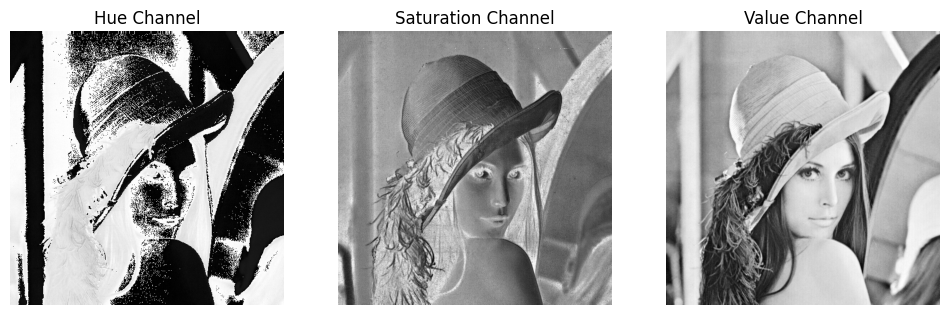

In [11]:
img = cv2.imread('lena_std.tif')    
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
#sidplay different channels

h, s, v = cv2.split(img_hsv)
plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(h, cmap='gray')
plt.axis('off')
plt.title('Hue Channel')

plt.subplot(132)
plt.imshow(s, cmap='gray')
plt.axis('off')
plt.title('Saturation Channel')

plt.subplot(133)
plt.imshow(v, cmap='gray')
plt.axis('off')
plt.title('Value Channel')

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

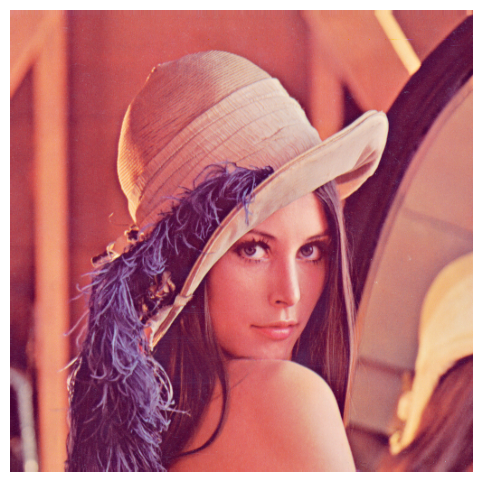

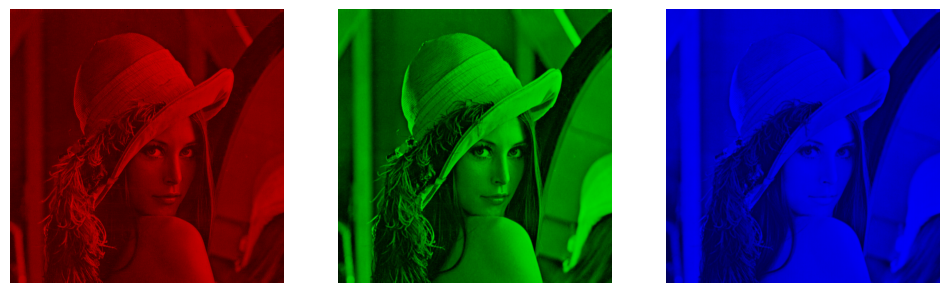

In [13]:
b, g, r = cv2.split(img)
plt.figure(figsize=(12, 6))
plt.imshow(cv2.merge([r, g, b]))
plt.axis('off')

zeros = np.zeros(img.shape[:2], dtype="uint8")

# Display the individual channels
plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(cv2.merge([b, zeros, zeros]))
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.merge([zeros, g, zeros]))
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.merge([zeros, zeros, r]))
plt.axis('off')

Image dimensions: 512x512
Quarter dimensions: 128.0x128.0
Translation matrix:
[[  1.   0. 128.]
 [  0.   1. 128.]]


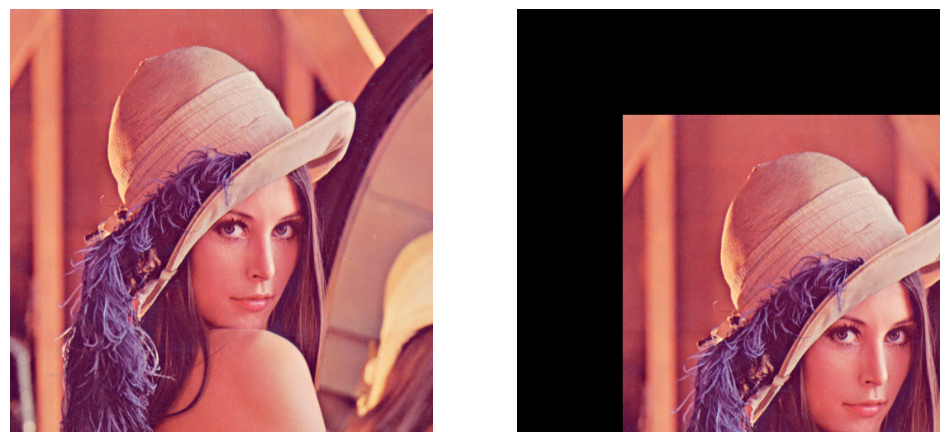

In [16]:
img = cv2.imread('lena_std.tif')

height, width = img.shape[:2]
print(f"Image dimensions: {width}x{height}")

quarter_height, quarter_width = height / 4, width / 4
print(f"Quarter dimensions: {quarter_width}x{quarter_height}")

T = np.float32([[1, 0, quarter_width], [0, 1, quarter_height]])
print(f"Translation matrix:\n{T}")

img_translation = cv2.warpAffine(img, T, (width, height))

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(img_translation, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

Image dimensions: 512x512


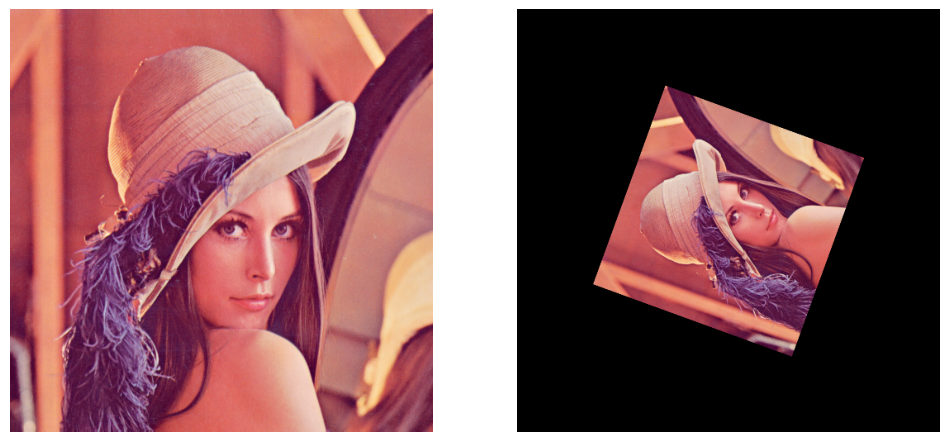

In [ ]:
img = cv2.imread('lena_std.tif')
#store the height and width of the image
height, width = img.shape[:2]
print(f"Image dimensions: {width}x{height}")

#rotate Image
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 70, 0.5)
# Apply the rotation matrix to get the rotated image
rotated_image = cv2.warpAffine(img, rotation_matrix, (width, height))

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

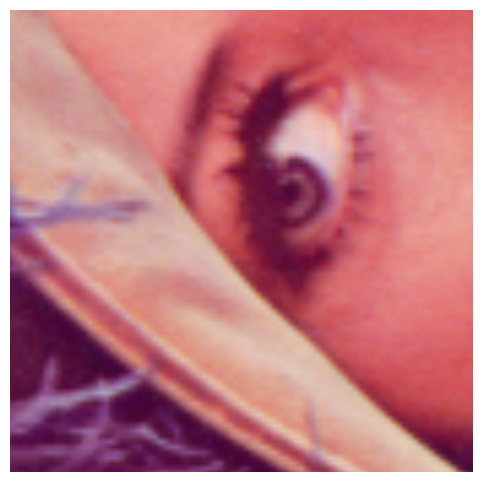

In [12]:
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 90, 6)
rotated_image = cv2.warpAffine(img, rotation_matrix, (width, height))
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
plt.axis('off')


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

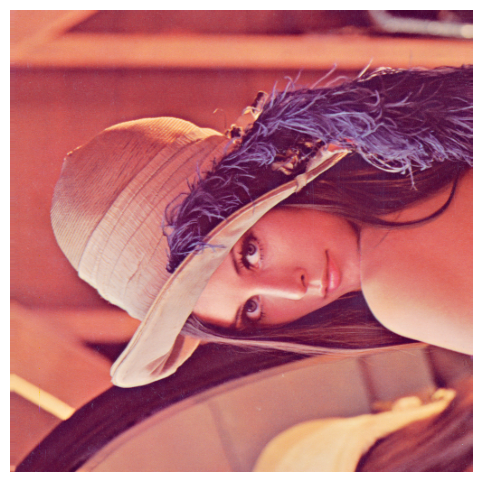

In [15]:
# Image Transpose
trans = cv2.transpose(img)
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(trans, cv2.COLOR_BGR2RGB))
plt.axis('off')

Possible interpolation methods are:

INTER_NEAREST - a nearest-neighbor interpolation

INTER_LINEAR - a bilinear interpolation (used by default)

INTER_AREA - resampling using pixel area relation

INTER_CUBIC - a bicubic interpolation over 4x4 pixel neighborhood

INTER_LANCZOS4 - a Lanczos interpolation over 8x8 pixel neighborhood

Text(0.5, 1.0, 'Area-based')

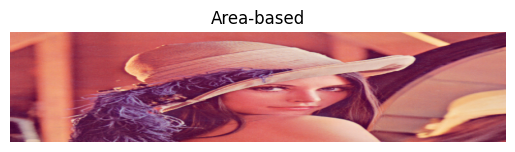

In [ ]:
# Image scaling and interpolation
# interoplatioon means the method of constructing new data points within the range of a discrete set of known data points
# Resize the image using different interpolation methods
resized_nearest = cv2.resize(img, (900,200), interpolation=cv2.INTER_NEAREST)
resized_linear = cv2.resize(img, (900,200), interpolation=cv2.INTER_LINEAR)
resized_cubic = cv2.resize(img, (900,200), interpolation=cv2.INTER_CUBIC)
resized_lanczos = cv2.resize(img, (900,200), interpolation=cv2.INTER_LANCZOS4)
resized_area = cv2.resize(img, (900,200), interpolation=cv2.INTER_AREA)

plt.imshow(cv2.cvtColor(resized_nearest, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Nearest Neighbor')

plt.imshow(cv2.cvtColor(resized_linear, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Bilinear')

plt.imshow(cv2.cvtColor(resized_cubic, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Bicubic')

plt.imshow(cv2.cvtColor(resized_area, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Area-based')

Text(0.5, 1.0, 'Lanczos')

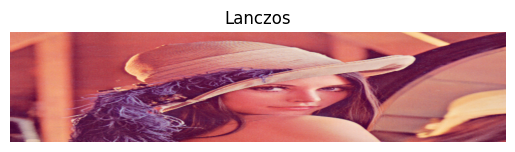

In [20]:
plt.imshow(cv2.cvtColor(resized_lanczos, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Lanczos')

(np.float64(-0.5), np.float64(383.5), np.float64(383.5), np.float64(-0.5))

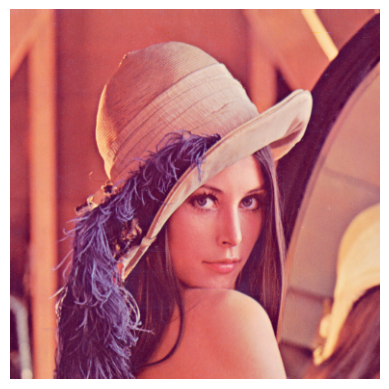

In [21]:
resized_nearest = cv2.resize(img, None, fx=0.75, fy=0.75)
plt.imshow(cv2.cvtColor(resized_nearest, cv2.COLOR_BGR2RGB))
plt.axis('off')

In [23]:
resized_nearest = cv2.resize(img, None, fx=2, fy=2)
cv2.imshow('Resized Image', resized_nearest)
# plt.imshow(cv2.cvtColor(resized_nearest, cv2.COLOR_BGR2RGB))
# plt.axis('off')

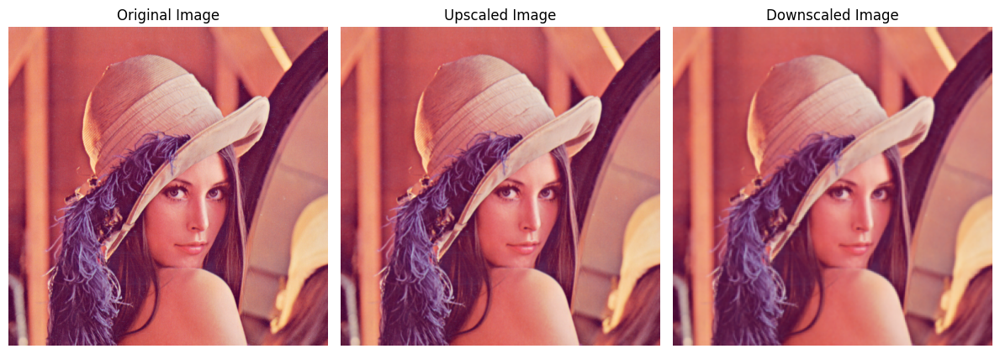

: 

In [ ]:
# Image resizing using pyrUp and pyrDown

# Upscale the image using pyrUp
upscaled = cv2.pyrUp(img)
# Downscale the image using pyrDown
downscaled = cv2.pyrDown(img)

plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Original Image')

plt.subplot(132)
plt.imshow(cv2.cvtColor(upscaled, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Upscaled Image')

plt.subplot(133)
plt.imshow(cv2.cvtColor(downscaled, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Downscaled Image')

plt.tight_layout()
plt.show()

(np.float64(-0.5), np.float64(255.5), np.float64(255.5), np.float64(-0.5))

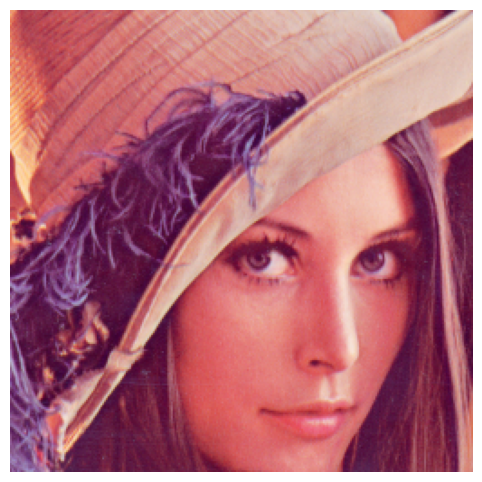

In [6]:
img = cv2.imread('lena_std.tif')
# Image cropping
height, width = img.shape[:2]

start_row, start_col = int(height * .25), int(width * .25)
end_row, end_col = int(height * .75), int(width * .75)

cropped = img[start_row:end_row, start_col:end_col]

plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
plt.axis('off')

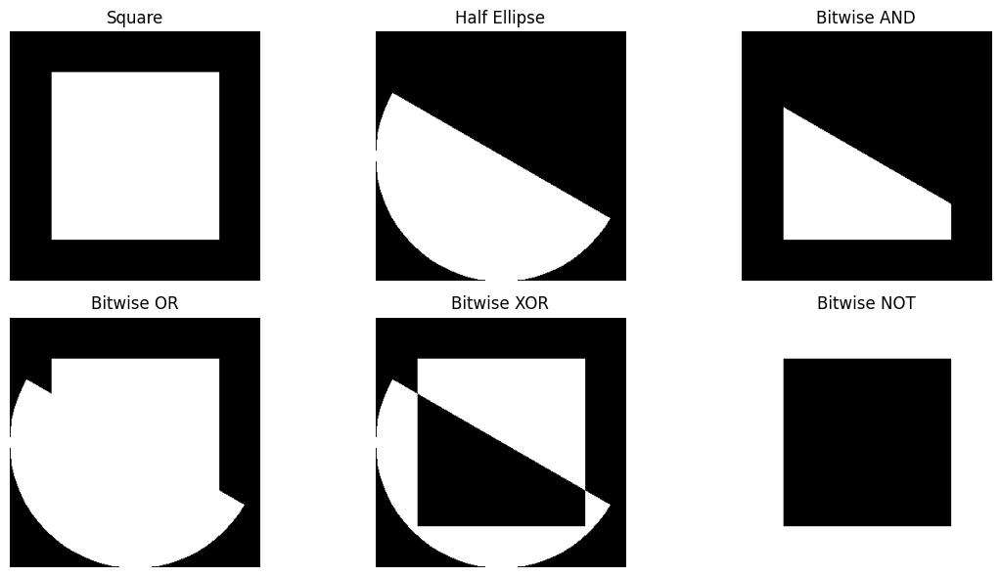

In [8]:
# bitwise operations
# square
sqr = np.zeros((300,300), dtype="uint8")
cv2.rectangle(sqr, (50, 50), (250, 250), 255, -1)
# half ellipse
mask = np.zeros((300,300), dtype="uint8")
cv2.ellipse(mask, (150, 150), (150, 150), 30, 0, 180, 255, -1)

# bitwise AND operation
masked = cv2.bitwise_and(sqr,mask)

# bitwise OR operation
bitwise_or = cv2.bitwise_or(sqr, mask)

# bitwise XOR operation
bitwise_xor = cv2.bitwise_xor(sqr, mask)

# bitwise NOT operation
bitwise_not = cv2.bitwise_not(sqr)

plt.figure(figsize=(12, 6))
plt.subplot(231)
plt.imshow(sqr, cmap='gray')
plt.axis('off')
plt.title('Square')

plt.subplot(232)
plt.imshow(mask, cmap='gray')
plt.axis('off')
plt.title('Half Ellipse')

plt.subplot(233)
plt.imshow(masked, cmap='gray')
plt.axis('off')
plt.title('Bitwise AND')

plt.subplot(234)
plt.imshow(bitwise_or, cmap='gray')
plt.axis('off')
plt.title('Bitwise OR')

plt.subplot(235)
plt.imshow(bitwise_xor, cmap='gray')
plt.axis('off')
plt.title('Bitwise XOR')

plt.subplot(236)
plt.imshow(bitwise_not, cmap='gray')
plt.axis('off')
plt.title('Bitwise NOT')
plt.tight_layout()
plt.show()

In [ ]:
# filter 2D
# src – input image.
# dst – output image of the same size and the same number of channels as src.
# ddepth – the output image depth (-1 to use src.depth()).
# kernel – convolution kernel (or rather a correlation kernel), a single-channel floating point matrix; if you want to apply different kernels to different channels, split the image using split() and process them individually.

In [ ]:
# # different types of kernels
# # Identity kernel
# identity_kernel = np.array([[0, 0, 0],
#                              [0, 1, 0],
#                              [0, 0, 0]])
# # Edge detection kernel
# edge_kernel = np.array([[1, 0, -1],
#                          [0, 0, 0],
#                          [-1, 0, 1]])
# # Sharpening kernel
# sharpen_kernel = np.array([[0, -1, 0],
#                             [-1, 5, -1],
#                             [0, -1, 0]])
# # Box blur kernel
# box_blur_kernel = np.array([[1, 1, 1],
#                             [1, 1, 1],
#                             [1, 1, 1]]) / 9.0
# # Gaussian blur kernel
# gaussian_blur_kernel = np.array([[1, 2, 1],
#                                 [2, 4, 2],
#                                 [1, 2, 1]]) / 16.0


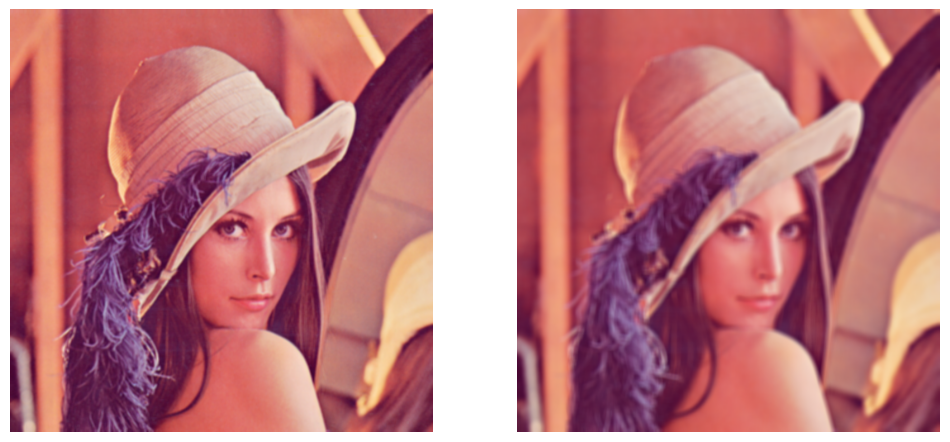

In [9]:
# Applying the Kernel
img = cv2.imread('lena_std.tif')

#create a 3x3 kernel
kernel_3X3 = np.ones((3,3), np.float32) / 9
kernel_7X7 = np.ones((7,7), np.float32) / 49

#apply the 3x3 kernel
blurred = cv2.filter2D(img, -1, kernel_3X3)
#apply the 7x7 kernel
blurred2 = cv2.filter2D(img, -1, kernel_7X7)

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(blurred2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

##Image Scaling and Resizing using interplotation [Link1](https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/) Link2]https://stackoverflow.com/questions/23853632/which-kind-of-interpolation-best-for-resizing-image)

#Some of the possible interpolation in openCV are:

* INTER_NEAREST – a nearest-neighbor interpolation
* INTER_LINEAR – a bilinear interpolation (used by default)
* INTER_AREA – resampling using pixel area relation. It may be a preferred method for image decimation, as it gives moire’-free results. But when the image is zoomed, it is similar to the INTER_NEAREST method.
* INTER_CUBIC – a bicubic interpolation over 4×4 pixel neighborhood
* INTER_LANCZOS4 – a Lanczos interpolation over 8×8 pixel neighborhood

Scaled to 3/4 image
Scaled to double the original image
Image resizing to required dimention


(np.float64(-0.5), np.float64(899.5), np.float64(399.5), np.float64(-0.5))

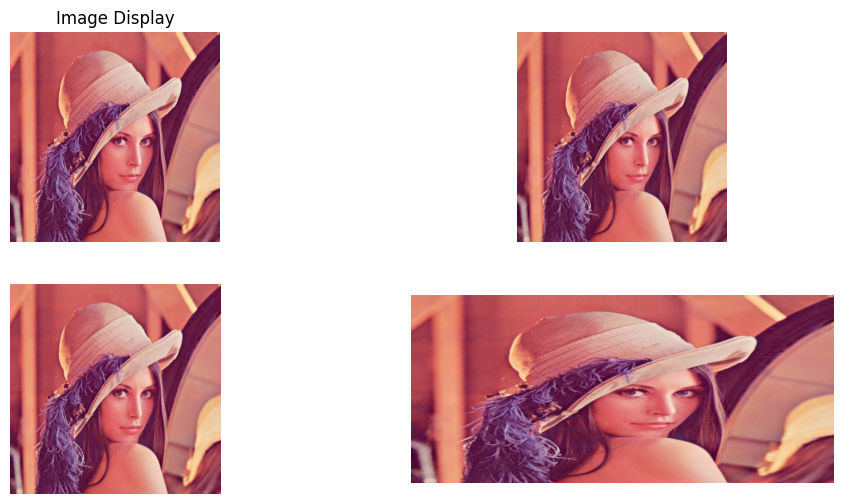

In [14]:
img = cv2.imread("lena_std.tif")

plt.figure(figsize=(12, 6))
plt.subplot(221)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Image Display')
plt.axis('off')

#1 - resizing image to 3/4 of original size
plt.subplot(222)
img_scaled = cv2.resize(img, None, fx = 0.75, fy = 0.75)
print("Scaled to 3/4 image")
plt.imshow(cv2.cvtColor(img_scaled, cv2.COLOR_BGR2RGB))
plt.axis('off')

#2 - resizing image to double of original size
plt.subplot(223)
img_double = cv2.resize(img, None, fx = 2, fy = 2)
#img_double = cv2.resize(img, None, fx = 2, fy = 2, interpolation=cv2.INTER_CUBIC)
print("Scaled to double the original image")
plt.imshow(cv2.cvtColor(img_double, cv2.COLOR_BGR2RGB))
plt.axis('off')

#3 - Image resizing to required dimention
plt.subplot(224)
img_req_resize = cv2.resize(img, (900, 400), interpolation=cv2.INTER_AREA)
print("Image resizing to required dimention")
plt.imshow(cv2.cvtColor(img_req_resize, cv2.COLOR_BGR2RGB))
plt.axis('off')

Image height is:  512
Image width is:  512
Original image
Cropped image


(np.float64(-0.5), np.float64(255.5), np.float64(255.5), np.float64(-0.5))

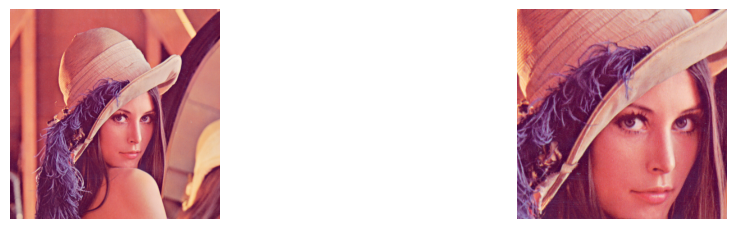

In [ ]:
#Storing Height and Width of the image for cropping
img = cv2.imread("lena_std.tif")
height, width = img.shape[:2]
print("Image height is: ", height)
print("Image width is: ", width)

#get the starting pixel coordinates(top left, of cropping rectangle)
start_row, start_col = int(height*.25), int(width*.25)

#get the ending pixel coordinates (bottom right)
end_row, end_col = int(height*.75), int(width*.75)

#corp the image
cropped_img = img[start_row:end_row, start_col:end_col]

plt.figure(figsize=(12, 6))
plt.subplot(221)
print("Original image")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(222)
print("Cropped image")
plt.imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

Image height is:  512
Image width is:  512
Original image
Cropped image


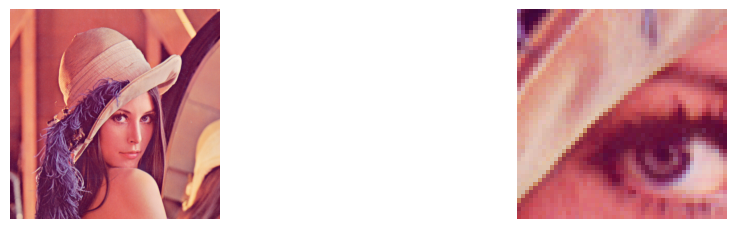

In [22]:
#Storing Height and Width of the image for cropping
img = cv2.imread("lena_std.tif")
height, width = img.shape[:2]
print("Image height is: ", height)
print("Image width is: ", width)

#get the starting pixel coordinates(top left, of cropping rectangle)
start_row, start_col = int(height*.45), int(width*.45)

#get the ending pixel coordinates (bottom right)
end_row, end_col = int(height*.55), int(width*.55)

#corp the image
cropped_img = img[start_row:end_row, start_col:end_col]

plt.figure(figsize=(12, 6))
plt.subplot(221)
print("Original image")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(222)
print("Cropped image")
plt.imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

Original image
Image after addition Operation
Image after Subtraction Operation
Image after Multipication Operation


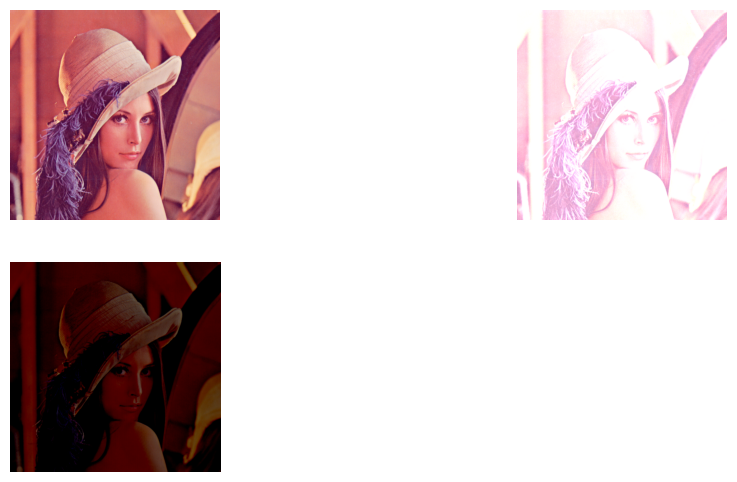

In [24]:
img = cv2.imread("lena_std.tif")

plt.figure(figsize=(12, 6))
plt.subplot(221)
print("Original image")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

#We create a matrix to perform image airthmeics (matirx having value of 150)
M = np.ones(img.shape, dtype="uint8") * 150
#M = np.zeros(img.shape, dtype="uint8") + 150

#Addition
add_img = cv2.add(img, M)
plt.subplot(222)
print("Image after addition Operation")
plt.imshow(cv2.cvtColor(add_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

#Subtraction
sub_img = cv2.subtract(img, M)
plt.subplot(223)
print("Image after Subtraction Operation")
plt.imshow(cv2.cvtColor(sub_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

#Multipication
mul_img = cv2.multiply(img, M)
plt.subplot(224)
print("Image after Multipication Operation")
plt.imshow(cv2.cvtColor(mul_img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

#We create a matrix to perform image airthmeics (matirx having value of 150)
M = np.zeros(img.shape, dtype="uint8") + 150

Original image
Blurred image 3x3
Blurred image 5x5
Blurred image 7x7
Blurred image 9x9
Blurred image 11x11


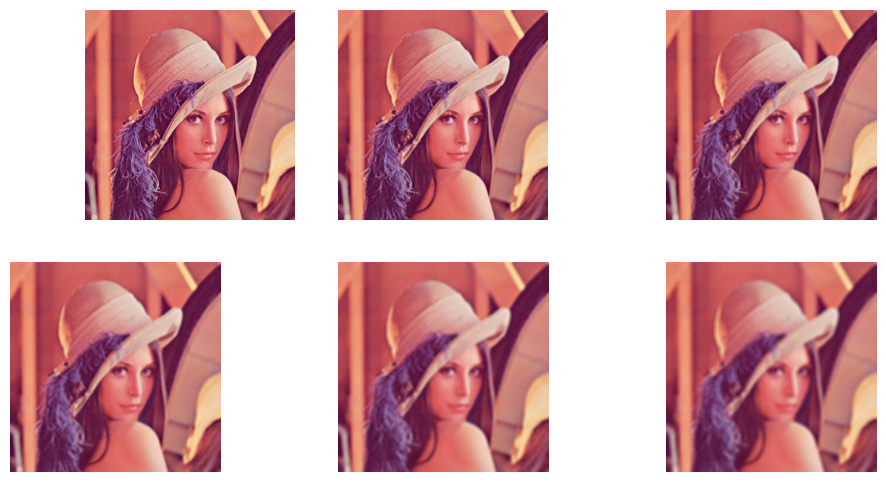

In [28]:
plt.figure(figsize=(12, 6))
plt.subplot(221)
print("Original image")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

#Creating a 3x3 Kernal Matrix (its a filter matrix to create blurring in lenna image)
kernal_3x3 = np.ones((3, 3), np.float32)/9 # 9 (Size of the kernal) is used for averaging to normailse as we are performing convolution
kernal_5x5 = np.ones((5, 5), np.float32)/25        
kernal_7x7 = np.ones((7, 7), np.float32)/49
kernal_9x9 = np.ones((9, 9), np.float32)/81
kernal_11x11 = np.ones((11, 11), np.float32)/121

# Creating Blurring effect
blur_img_3x3 = cv2.filter2D(img, -1, kernal_3x3) # -1 = image depth
plt.subplot(232)
print("Blurred image 3x3")
plt.imshow(cv2.cvtColor(blur_img_3x3, cv2.COLOR_BGR2RGB))
plt.axis('off')

blur_img_5x5 = cv2.filter2D(img, -1, kernal_5x5) # -1 = image depth
plt.subplot(233)
print("Blurred image 5x5")
plt.imshow(cv2.cvtColor(blur_img_5x5, cv2.COLOR_BGR2RGB))
plt.axis('off')

blur_img_7x7 = cv2.filter2D(img, -1, kernal_7x7) # -1 = image depth
plt.subplot(234)
print("Blurred image 7x7")
plt.imshow(cv2.cvtColor(blur_img_7x7, cv2.COLOR_BGR2RGB))
plt.axis('off')

blur_img_9x9 = cv2.filter2D(img, -1, kernal_9x9) # -1 = image depth
plt.subplot(235)
print("Blurred image 9x9")
plt.imshow(cv2.cvtColor(blur_img_9x9, cv2.COLOR_BGR2RGB))
plt.axis('off')

blur_img_11x11 = cv2.filter2D(img, -1, kernal_11x11) # -1 = image depth
plt.subplot(236)
print("Blurred image 11x11")
plt.imshow(cv2.cvtColor(blur_img_11x11, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

Blurred image 3x3
Blurred image 5x5
Blurred image 7x7
Blurred image 9x9
Blurred image 11x11


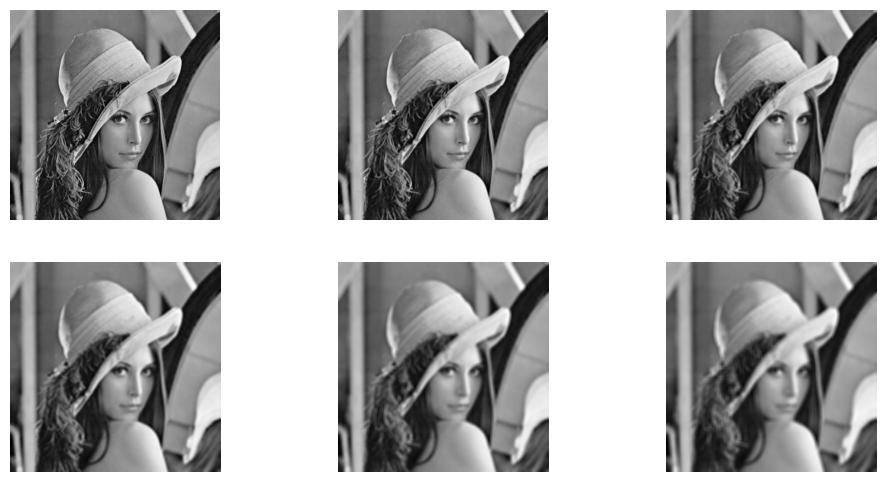

In [30]:
gry_scl = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(12, 6))
plt.subplot(231)
plt.imshow(gry_scl, cmap='gray')
plt.axis('off')

#Creating a 3x3 Kernal Matrix (its a filter matrix to create blurring in lenna image)
kernal_3x3 = np.ones((3, 3), np.float32)/9 # 9 (Size of the kernal) is used for averaging to normailse as we are performing convolution
kernal_5x5 = np.ones((5, 5), np.float32)/25
kernal_7x7 = np.ones((7, 7), np.float32)/49
kernal_9x9 = np.ones((9, 9), np.float32)/81
kernal_11x11 = np.ones((11, 11), np.float32)/121

# Creating Blurring effect
blur_img_3x3 = cv2.filter2D(gry_scl, -1, kernal_3x3) # -1 = image depth
plt.subplot(232)
print("Blurred image 3x3")
plt.imshow(blur_img_3x3, cmap='gray')
plt.axis('off')

blur_img_5x5 = cv2.filter2D(gry_scl, -1, kernal_5x5) # -1 = image depth
plt.subplot(233)
print("Blurred image 5x5")
plt.imshow(blur_img_5x5, cmap='gray')
plt.axis('off')

blur_img_7x7 = cv2.filter2D(gry_scl, -1, kernal_7x7) # -1 = image depth
plt.subplot(234)
print("Blurred image 7x7")
plt.imshow(blur_img_7x7, cmap='gray')
plt.axis('off')

blur_img_9x9 = cv2.filter2D(gry_scl, -1, kernal_9x9) # -1 = image depth
plt.subplot(235)
print("Blurred image 9x9")
plt.imshow(blur_img_9x9, cmap='gray')
plt.axis('off')

blur_img_11x11 = cv2.filter2D(gry_scl, -1, kernal_11x11) # -1 = image depth
plt.subplot(236)
print("Blurred image 11x11")
plt.imshow(blur_img_11x11, cmap='gray')
plt.axis('off')

plt.show()

Edge Detection

Original image
Kernel Blur


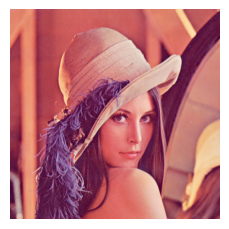

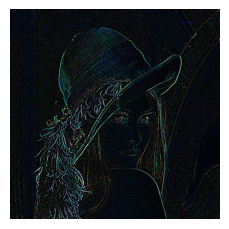

In [36]:
plt.figure(figsize=(12, 6))
plt.subplot(221)
print("Original image")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

#Creating a 3x3 Kernal Matrix (its a filter matrix to create blurring in lenna image)
kernel2 = np.array([[-1, -1, -1],
                    [-1, 8, -1],
                    [-1, -1, -1]])

# Applying the filter2D() function
img1 = cv2.filter2D(src=img, ddepth=-1, kernel=kernel2)

# Shoeing the original and output image
plt.figure(figsize=(12, 6))
plt.subplot(222)
print("Kernel Blur")
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

# Edge Detection - helps in finding the shape of a object
[Edge Detection](https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Gradient_Sobel_Laplacian_Derivatives_Edge_Detection.php)

* The discontinuity in the image brightness is called an edge.
* Edge detection is the technique used to identify the regions in the image where the brightness of the image changes sharply.
* This sharp change in the intensity value is observed at the local minima or local maxima in the image histogram, using the first-order derivative.
* DIfferent techniques includes:
* Prewitt Operator
* Scharr Operator
* Sobel Operator

* Steps:
* * Read the image.
* * Convert into grayscale if it is colored.
* * Convert into the double format.
* * Define the mask or filter.
* * Detect the edges along X-axis.
* * Detect the edges along Y-axis.
* * Combine the edges detected along the X and Y axes.
* * Display all the images.



## Prewitt Operator
* The Prewitt operator was developed by Judith M. S. Prewitt.
* Prewitt operator is used for edge detection in an image.
* Prewitt operator detects both types of edges, these are:
* * Horizontal edges or along the x-axis,
* * Vertical Edges or along the y-axis.
* Wherever there is a sudden change in pixel intensities, an edge is detected by the mask.
* Since the edge is defined as the change in pixel intensities, it can be calculated by using differentiation.
* Prewitt mask is a first-order derivate mask.
* In the graph representation of Prewitt-mask’s result, the edge is represented by the local maxima or local minima.

* Both the first and second derivative masks follow these three properties:

* * More weight means more edge detection.
* * The opposite sign should be present in the mask. (+ and -)
* * The Sum of the mask values must be equal to zero.
* Prewitt operator provides us two masks one for detecting edges in the *horizontal direction* and another for detecting edges in a *vertical direction*.
* Prewitt Operator [X-axis] = [ -1 0 1; -1 0 1; -1 0 1]

* Prewitt Operator [Y-axis] = [-1 -1 -1; 0 0 0; 1 1 1]

Image height is:  512
Image width is:  512
Original image
Prewitt X image
Prewitt Y image
prewitty OR image


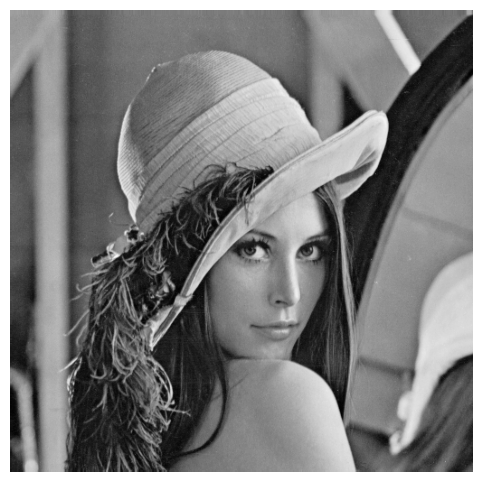

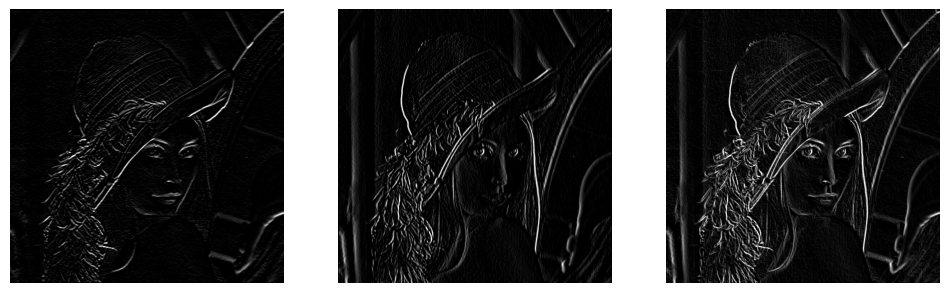

In [41]:
img = cv2.imread("lena_std.tif", 0)
#Storing Height and Width of the image for cropping
height, width = img.shape[:2]
print("Image height is: ", height)
print("Image width is: ", width)
plt.figure(figsize=(12, 6))
plt.subplot(111)
print("Original image")
plt.imshow(img, cmap='gray')
plt.axis('off')

#prewitt
kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
img_prewittx = cv2.filter2D(img, -1, kernelx)
img_prewitty = cv2.filter2D(img, -1, kernely)

plt.figure(figsize=(12, 6))
plt.subplot(131)
print("Prewitt X image")
plt.imshow(img_prewittx, cmap='gray')
plt.axis('off')

plt.subplot(132)
print("Prewitt Y image")
plt.imshow(img_prewitty, cmap='gray')
plt.axis('off')

#Bitwise ORing of both images
plt.subplot(133)
prewitty_OR_img = cv2.bitwise_or(img_prewittx, img_prewitty)
print("prewitty OR image")
plt.imshow(prewitty_OR_img, cmap='gray')
plt.axis('off')

plt.show()